# Vision Transformer v.s Convolutional Neural Network Model in Adversarial Attacks

Kelly Tong

Link to Colab: https://colab.research.google.com/drive/1WcBTCgpkWkgHC5u2PiRFIY5cjxX-MCZe#scrollTo=N312FTST86J3

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Kelly0604/ViT_vs_CNN_Adversarial_Attacks/blob/main/ViT_vs_CNN_Adversarial_Attacks.ipynb)

## Introduction

This final project examines the comparative performance of Convolutional Neural Networks (CNNs) and Vision Transformers (ViTs) in the context of adversarial attacks. CNNs, which have long dominated computer vision tasks, are well-documented for their vulnerability to adversarial examples. The subtle perturbations of adversarial attacks cause models to misclassify inputs with high confidence. ViTs, a more recent architecture leveraging self-attention mechanisms, have shown promise in achieving competitive or superior results in various vision tasks. However, their behavior under adversarial conditions, especially compared to CNNs, remains less thoroughly studied. This project aims to provide insights into their performance differences when subjected to adversarial perturbations, focusing on accuracy as the primary evaluation metric.

Furthermore, explainable Artificial Intelligence techiniques such as saliency map is applied to visualize whether the two models rely on different features in predicting and labeling the adversarial examples. Understanding the model prediction process is important as explainability is becoming increasingly crucial especially when dealing with impactful decisions in areas like healthcare, finance, and criminal justice. Explainability enhances model interpretability, allowing users to understand and explain AI decisions, while also addressing regulatory requirements that demand transparency and accountability. Moreover, it fosters trust and adoption of AI systems, supports model validation by detecting biases and errors, and aids in debugging and improvement, making it easier to identify and correct issues in the decision-making process


## Background / Literature Review

The findings in "On the Robustness of Vision Transformers to Adversarial Examples" by Kaleel Mahmood et al., seeks to address gaps in understanding adversarial performance differences between CNNs and ViTs. Research has shown that CNNs are often highly transferable in adversarial examples, which means that the adversarial attacks designed for one CNN often succeed on others. On the other hand, ViTs exhibit distinct properties, with adversarial examples showing lower transferability between ViTs and CNNs.

Moreover, CNNs and ViTs differ fundamentally in their approach to processing images, with CNNs relying on spatially localized convolutional filters and ViTs leveraging global self-attention mechanisms. These architectural differences motivate a deeper exploration of how each model performs under adversarial scenarios.

## Extended Motivations

An additional motivations in generating Adversarial Attacks using Vision Transformers and Convolutional Neural Network Models lies in the fact that my best friend is a fashion designer who often struggles with protecting her own copyright designs as well as coming up with creative notions to her designed costumes. This knowledge of generating adversarial attacks provide alternative tracks and perspectives for designs while securing her works to AI technologies.

# Import Necessary Packages

The necessary packages are imported here for successfully running all code chunks below.

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from transformers import ViTForImageClassification, ViTImageProcessor
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from PIL import Image

# Loading Dataset

The dataset used in this study is CIFAR-10, a well-known benchmark in computer vision research. CIFAR-10 comprises 60,000 32x32 color images evenly distributed across 10 classes, including airplanes, automobiles, birds, cats, dogs, and more. The dataset is split into 50,000 training images and 10,000 testing images, offering a balanced and manageable framework for training and evaluation. Despite its relatively small image size, CIFAR-10 provides a diverse set of classes that challenge models to generalize across various object types. Its popularity in adversarial machine learning research makes it a fitting choice for comparing the performance of CNNs and ViTs under adversarial conditions.

In [1]:
# Preprocessing
# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [2]:
# Load CIFAR-10 dataset and Apply Transformations

train_dataset = datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
test_dataset = datasets.CIFAR10(root="./data", train=False, transform=transform, download=True)

# DataLoader for training and testing
# Optimized DataLoader for training and testing

train_loader = DataLoader(
    train_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
    prefetch_factor=2,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

100%|██████████| 170M/170M [00:01<00:00, 99.2MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [5]:
# Checks if all labels are in the range of 0-9 as these are the expected labels for the CIFAR-10 dataset
for images, labels in test_loader:
    print(f"Labels: {labels}")
    break

Labels: tensor([3, 8, 8, 0, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 8])


# Loading Pretrained Models

Two pre-trained models are loaded here for evaluating performance under adversarial conditions: ResNet-50 and ViT-base-patch16-224. ResNet-50, a Convolutional Neural Network (CNN), is a widely recognized architecture known for its deep residual learning framework, which enables efficient training of very deep networks by introducing skip connections. This model is pre-trained on the ImageNet dataset, ensuring robust initial performance on standard vision tasks.

In contrast, the Vision Transformer (ViT-base-patch16-224) represents a newer paradigm in computer vision, leveraging self-attention mechanisms to process image patches as sequences. The ViT model and its corresponding image processor are also pre-trained on ImageNet, making them suitable for high-level feature extraction.

In [3]:
# Load ResNet-50 (CNN)
cnn_model = resnet50(pretrained=True)
cnn_model.eval()

# Load ViT-base-patch16-224
vit_model = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224")
vit_processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")
vit_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 179MB/s]
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, 

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

In [6]:
# ResNet output shape
resnet_outputs = cnn_model(images)
print(f"ResNet outputs: {resnet_outputs.shape}")

# ViT output shape
vit_outputs = vit_model(images).logits
print(f"ViT outputs: {vit_outputs.shape}")

ResNet outputs: torch.Size([16, 1000])
ViT outputs: torch.Size([16, 1000])


# Transfer Learning

Here we will apply transfer learning for both models. As we have used the pre-trained models of CNN and ViT trained on a larger dataset "ImageNet", we need to modify the final layer from 1000 classes (designed for "ImageNet") to 10 classes (suitable for "CIFAR-19"). After altering the architecture of the final layer, the model can be fine-tuned on "CIFAR-10" dataset.

Transfer learning is helpful here as the advantages of this pretrained model on larger dataset is taken while the last layer adapts to the new features of the new tasks. This usually helps improving the performance.

In [13]:
# Modify ResNet for CIFAR-10
cnn_model.fc = nn.Linear(cnn_model.fc.in_features, 10)

# Modify ViT for CIFAR-10
vit_model.classifier = nn.Linear(vit_model.classifier.in_features, 10)

In [15]:
# Check device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move models to the selected device
cnn_model = cnn_model.to(device)
vit_model = vit_model.to(device)

# Set up optimizer and loss
optimizer = optim.Adam(list(cnn_model.parameters()) + list(vit_model.parameters()), lr=0.001)
criterion = nn.CrossEntropyLoss()

Using device: cuda


In [16]:
# Train ResNet
cnn_model.train()
for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    cnn_outputs = cnn_model(images)
    cnn_loss = criterion(cnn_outputs, labels)
    cnn_loss.backward()
    optimizer.step()

In [17]:
# Train ViT
vit_model.train()
for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    vit_outputs = vit_model(images)
    vit_logits = vit_outputs.logits
    vit_loss = criterion(vit_logits, labels)
    vit_loss.backward()
    optimizer.step()

In [18]:
# Evaluate ResNet on CIFAR-10 test set with clean images
cnn_clean_accuracy = evaluate_model(cnn_model, images, labels)
print(f"ResNet Accuracy on Clean CIFAR-10 Images: {cnn_clean_accuracy:.2%}")

# Evaluate ViT on CIFAR-10 test set with clean images
vit_clean_accuracy = evaluate_model(vit_model, images, labels)
print(f"ViT Accuracy on Clean CIFAR-10 Images: {vit_clean_accuracy:.2%}")

ResNet Accuracy on Clean CIFAR-10 Images: 68.75%
ViT Accuracy on Clean CIFAR-10 Images: 43.75%


The accuracy for ResNet50 model on clean CIFAR-10 images (no adversarial attacks applied here) is 68.75%. The accuracy for Vision Transformer on clean CIFAR-10 images is 43.75%. These clean accuacies can serve as the standards for comparison after adversarial attacks are applied later.

 The higher accuracy of ResNet-50 aligns with its design and optimization for smaller datasets like CIFAR-10. CNNs, with their convolutional layers, are particularly effective at capturing local patterns in smaller images.

 The lower accuracy of Vision Transformmer model compared to ResNet50 model here might be due to the fact that usually a larger pretrained model is requried by Vision Transformer. ViTs are designed to process image patches as sequences and rely on global self-attention mechanisms, which may require more extensive pre-training or fine-tuning on larger datasets. The small size of CIFAR-10 images (32x32) and limited data volume might hinder ViT's ability to generalize effectively.

# Generating Adversarial Attacks

This section includes the function for generating adversarial attack examples. This function is compatible for both models (CNN and ViT). The epsilon is set to be 0.0001 here, but can be adapted to change when the function is called later.

In [10]:
def generate_adversarial_example(model, inputs, target_labels, epsilon=0.0001):
    inputs.requires_grad = True
    outputs = model(inputs)

    # For ViT, use logits; for CNN, use outputs directly
    if hasattr(outputs, "logits"):
        outputs = outputs.logits

    loss = torch.nn.CrossEntropyLoss()(outputs, target_labels)
    model.zero_grad()
    loss.backward()

    # Generate adversarial example
    adv_inputs = inputs + epsilon * inputs.grad.sign()
    adv_inputs = torch.clamp(adv_inputs, -1, 1)  # Ensure values are in range
    return adv_inputs

# Evaluate the Models

This section includes the function for evaluating the models' performance. The difference in evaluating CNN and ViT is considered with `if hasattr(outputs, "logits"): outputs = outputs.logits` which is designed for ViT.

In [11]:
def evaluate_model(model, inputs, labels):
    with torch.no_grad():
        outputs = model(inputs)
        if hasattr(outputs, "logits"):  # For ViT
            outputs = outputs.logits
        preds = torch.argmax(outputs, dim=1)
        accuracy = (preds == labels).float().mean().item()
    return accuracy

# Testing

CNN and ViT models are used to generate adversarial examples and are evaluated using the two functions in sections above. Accuracies under 4 different conditions are evaluated here: CNN model on predicting ViT generated adversarial examples; ViT model on predicting CNN generated adversarial examples; CNN on predicting its own adversarial examples; as well as ViT on predicting its own adversarial examples. Addiitonally, three different epsilon values are tested here: 0.1, 0.2, and 0.5. Larger epsilon values represent stronger and more powerful attacks.


When Epsilon=0.1:


In [28]:
# Set to evaluation mode
cnn_model.eval()
vit_model.eval()

# Load a batch of clean images and labels
images, labels = next(iter(test_loader))

# Move data to the same device as the models
images, labels = images.to(device), labels.to(device)

# Generate adversarial examples using CNN (ResNet-50)
adv_images_cnn = generate_adversarial_example(cnn_model, images, labels, epsilon=0.1)

# Generate adversarial examples using ViT
adv_images_vit = generate_adversarial_example(vit_model, images, labels, epsilon=0.1)

# Evaluate CNN on adversarial examples generated by ViT
cnn_on_vit_adv_acc = evaluate_model(cnn_model, adv_images_vit, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by ViT: {cnn_on_vit_adv_acc:.2%}")

# Evaluate ViT on adversarial examples generated by CNN
vit_on_cnn_adv_acc = evaluate_model(vit_model, adv_images_cnn, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by CNN: {vit_on_cnn_adv_acc:.2%}")

# Evaluate each model on its own adversarial examples
cnn_self_adv_acc = evaluate_model(cnn_model, adv_images_cnn, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by CNN: {cnn_self_adv_acc:.2%}")

vit_self_adv_acc = evaluate_model(vit_model, adv_images_vit, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by ViT: {vit_self_adv_acc:.2%}")

CNN Accuracy on Adversarial Examples Generated by ViT: 31.25%
ViT Accuracy on Adversarial Examples Generated by CNN: 37.50%
CNN Accuracy on Adversarial Examples Generated by CNN: 12.50%
ViT Accuracy on Adversarial Examples Generated by ViT: 6.25%


When Epsilon=0.2:


In [32]:
# Generate adversarial examples using CNN (ResNet-50)
adv_images_cnn = generate_adversarial_example(cnn_model, images, labels, epsilon=0.2)

# Generate adversarial examples using ViT
adv_images_vit = generate_adversarial_example(vit_model, images, labels, epsilon=0.2)

# Evaluate CNN on adversarial examples generated by ViT
cnn_on_vit_adv_acc = evaluate_model(cnn_model, adv_images_vit, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by ViT: {cnn_on_vit_adv_acc:.2%}")

# Evaluate ViT on adversarial examples generated by CNN
vit_on_cnn_adv_acc = evaluate_model(vit_model, adv_images_cnn, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by CNN: {vit_on_cnn_adv_acc:.2%}")

# Evaluate each model on its own adversarial examples
cnn_self_adv_acc = evaluate_model(cnn_model, adv_images_cnn, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by CNN: {cnn_self_adv_acc:.2%}")

vit_self_adv_acc = evaluate_model(vit_model, adv_images_vit, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by ViT: {vit_self_adv_acc:.2%}")

CNN Accuracy on Adversarial Examples Generated by ViT: 37.50%
ViT Accuracy on Adversarial Examples Generated by CNN: 6.25%
CNN Accuracy on Adversarial Examples Generated by CNN: 37.50%
ViT Accuracy on Adversarial Examples Generated by ViT: 0.00%


When Epsilon=0.5:


In [34]:
# Generate adversarial examples using CNN (ResNet-50)
adv_images_cnn = generate_adversarial_example(cnn_model, images, labels, epsilon=0.5)

# Generate adversarial examples using ViT
adv_images_vit = generate_adversarial_example(vit_model, images, labels, epsilon=0.5)

# Evaluate CNN on adversarial examples generated by ViT
cnn_on_vit_adv_acc = evaluate_model(cnn_model, adv_images_vit, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by ViT: {cnn_on_vit_adv_acc:.2%}")

# Evaluate ViT on adversarial examples generated by CNN
vit_on_cnn_adv_acc = evaluate_model(vit_model, adv_images_cnn, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by CNN: {vit_on_cnn_adv_acc:.2%}")

# Evaluate each model on its own adversarial examples
cnn_self_adv_acc = evaluate_model(cnn_model, adv_images_cnn, labels)
print(f"CNN Accuracy on Adversarial Examples Generated by CNN: {cnn_self_adv_acc:.2%}")

vit_self_adv_acc = evaluate_model(vit_model, adv_images_vit, labels)
print(f"ViT Accuracy on Adversarial Examples Generated by ViT: {vit_self_adv_acc:.2%}")

CNN Accuracy on Adversarial Examples Generated by ViT: 37.50%
ViT Accuracy on Adversarial Examples Generated by CNN: 0.00%
CNN Accuracy on Adversarial Examples Generated by CNN: 37.50%
ViT Accuracy on Adversarial Examples Generated by ViT: 0.00%


## Explaination on the output

ViT consistently struggles more on adversarial examples generated by itself. This is obvious if we looks at the epsilon=0.1 scenario, in which the accuracy of ViT predicting CNN generated adversarial examples is 37.5%, while the accuracy drops to 6.25% for adversarial exmaples generated by itself. This suggests the vulnerability of ViT. The ViT generated adversarial examples are highly tailored and effective in fooling ViT.

This might be caused by the fact that CNNs and ViTs have very different means of processing images. While CNNs use convolutional layers to capture local features, ViTs use attention mechanism to search for relationships across the entire image. This architectural difference results in adversarial examples being less transferable between the two models. Specifically, the CNN generated adversarial examples have lower transferability to ViT in this case.

ResNet50, however, in this case have the same accuracy in predicting adversarial examples generated by CNN and ViT when epsilon values equal 0.2 and 0.5 here. The accuracy remains as 37.5%. This suggests certain robustness of the ResNet 50 model.

# Visualize Adversarial Examples created by CNN

Since CNN seems to be found as the mmore robust model, in this section, several adversarial examples are visualized with the CNN model under different epsilon values. The clean image, adversarial image and the perturbations are all shown in the visualization. The perturbation demonstrates what causes the model to be fooled.

In [30]:
def visualize_adversarial_examples(clean_images, adv_images, labels, preds, class_names):
    """
    Visualize clean and adversarial images along with their perturbations.
    """
    batch_size = clean_images.size(0)
    num_images = min(batch_size, 5)

    clean_images = clean_images.cpu().permute(0, 2, 3, 1)
    adv_images = adv_images.cpu().permute(0, 2, 3, 1)
    perturbations = adv_images - clean_images

    fig, axes = plt.subplots(num_images, 3, figsize=(12, num_images * 4))

    for i in range(num_images):
        # Clean image
        axes[i, 0].imshow(clean_images[i].detach().numpy() * 0.5 + 0.5)
        axes[i, 0].set_title(f"Clean: {class_names[labels[i]]}")
        axes[i, 0].axis("off")

        # Adversarial image
        axes[i, 1].imshow(adv_images[i].detach().numpy() * 0.5 + 0.5)
        axes[i, 1].set_title(f"Adversarial: {class_names[preds[i]]}")
        axes[i, 1].axis("off")

        # Perturbation
        axes[i, 2].imshow((perturbations[i].detach().abs().numpy() / perturbations[i].detach().abs().max()).clip(0, 1))
        axes[i, 2].set_title("Perturbation")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

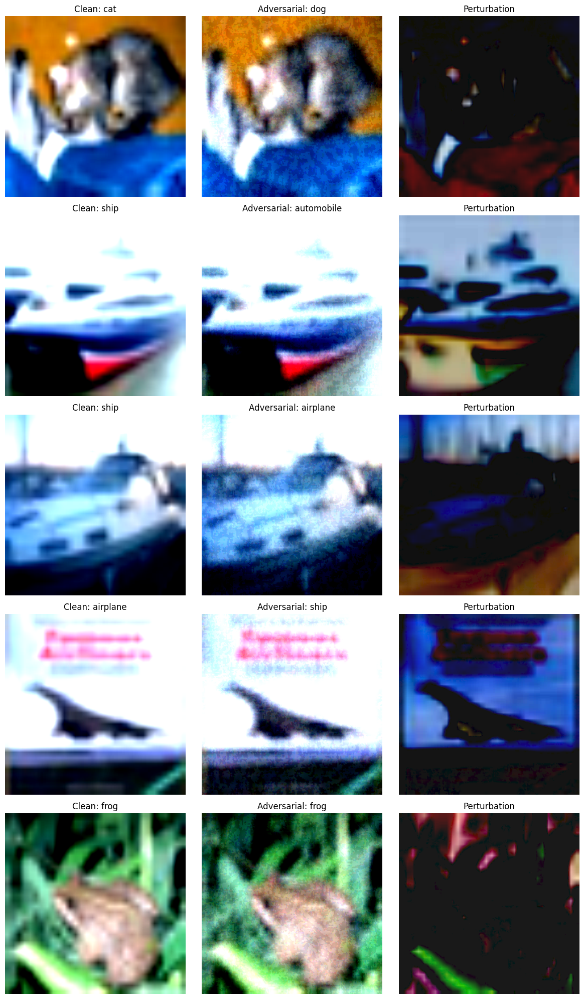

In [31]:
# Epsilon = 0.1
class_names = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

# Predict labels on adversarial examples
with torch.no_grad():
    adv_preds_cnn = cnn_model(adv_images_cnn).argmax(dim=1).cpu()

# Visualize the clean images, adversarial images, and their perturbations
visualize_adversarial_examples(images, adv_images_cnn, labels.cpu(), adv_preds_cnn, class_names)


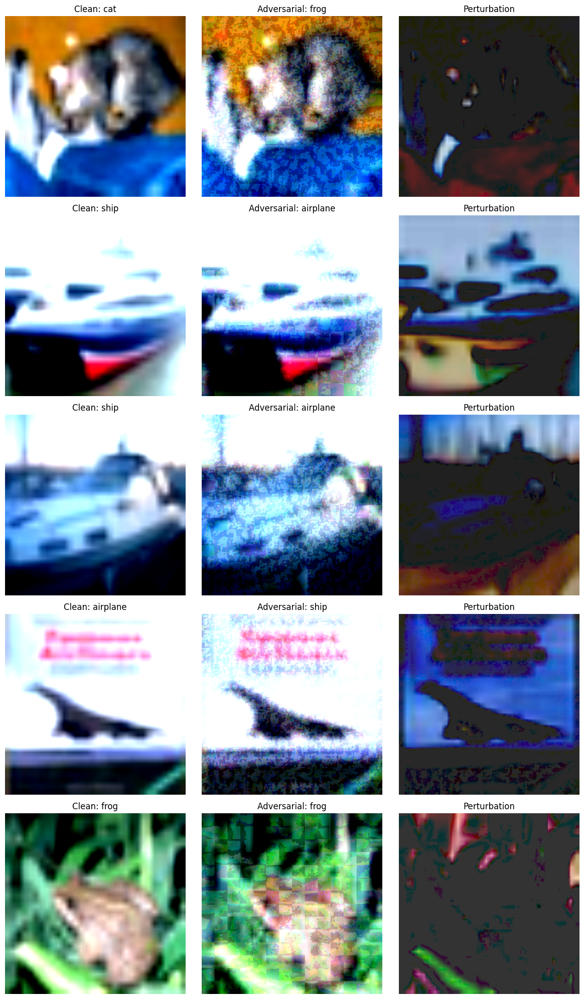

In [33]:
# Epsilon=0.2
class_names = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

# Predict labels on adversarial examples
with torch.no_grad():
    adv_preds_cnn = cnn_model(adv_images_cnn).argmax(dim=1).cpu()

# Visualize the clean images, adversarial images, and their perturbations
visualize_adversarial_examples(images, adv_images_cnn, labels.cpu(), adv_preds_cnn, class_names)

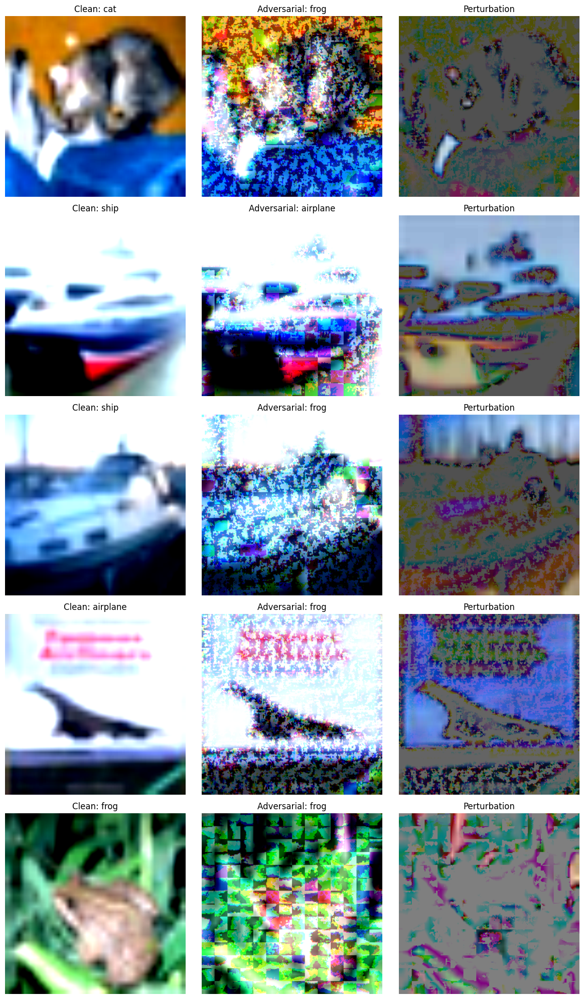

In [35]:
# Epsilon = 0.5
class_names = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

# Predict labels on adversarial examples
with torch.no_grad():
    adv_preds_cnn = cnn_model(adv_images_cnn).argmax(dim=1).cpu()

# Visualize the clean images, adversarial images, and their perturbations
visualize_adversarial_examples(images, adv_images_cnn, labels.cpu(), adv_preds_cnn, class_names)


# Compare Visualizations from CNN and ViT models

This section sets the epsilon value to 0.01 and compares the adversarial exmaples generated by CNN and ViT models. Base on their perturbations, both models seem to be fooled by the same features of the image (more global features, less local cases). They also do predict different examples correctly. For instance, ViT is able to predict the Ship adversarial attack example correctly while CNN fails to do so. CNN is able to predict the Frog adversarial attack example accurately while ViT fails.

CNN's characteristic of focusing on global features makes it more robust to partial occlusion, effective at generalizing across complex scenes, and consistent in predictions. However, this global focus also makes them vulnerable to adversarial attacks, inefficient in sparse images, and less effective for fine-grained classification tasks.

In contrast, Vision Transformers (ViTs) emphasize local features, excelling in fine-grained tasks and ignoring irrelevant background noise, which enhances efficiency in sparse images. However, this localized attention makes ViTs sensitive to occlusion, prone to overfitting specific features, and less capable of utilizing global context.

The choice between CNNs and ViTs depends on the task, with CNNs better suited for comprehensive and integrated scene understanding and ViTs excelling in detailed, fine-grained analysis.


In [42]:
def compare_visualizations(clean_images, adv_images_cnn, adv_images_vit, labels, preds_cnn, preds_vit, class_names):
    """
    Compare clean images and adversarial examples generated by CNN and ViT.
    """
    batch_size = clean_images.size(0)
    num_images = min(batch_size, 5)

    clean_images = clean_images.detach().cpu().permute(0, 2, 3, 1)
    adv_images_cnn = adv_images_cnn.detach().cpu().permute(0, 2, 3, 1)
    adv_images_vit = adv_images_vit.detach().cpu().permute(0, 2, 3, 1)
    perturbations_cnn = (adv_images_cnn - clean_images).abs()
    perturbations_vit = (adv_images_vit - clean_images).abs()

    fig, axes = plt.subplots(num_images, 5, figsize=(15, num_images * 3))

    for i in range(num_images):
        # Clean image
        axes[i, 0].imshow(clean_images[i].numpy() * 0.5 + 0.5)
        axes[i, 0].set_title(f"Clean: {class_names[labels[i]]}")
        axes[i, 0].axis("off")

        # Adversarial image (CNN)
        axes[i, 1].imshow(adv_images_cnn[i].numpy() * 0.5 + 0.5)
        color_cnn = "red" if preds_cnn[i] != labels[i] else "green"
        axes[i, 1].set_title(f"CNN Adv: {class_names[preds_cnn[i]]}", color=color_cnn)
        axes[i, 1].axis("off")

        # Perturbation (CNN)
        axes[i, 2].imshow((perturbations_cnn[i].numpy() / perturbations_cnn[i].max()).clip(0, 1))
        axes[i, 2].set_title("Perturbation (CNN)")
        axes[i, 2].axis("off")

        # Adversarial image (ViT)
        axes[i, 3].imshow(adv_images_vit[i].numpy() * 0.5 + 0.5)
        color_vit = "red" if preds_vit[i] != labels[i] else "green"
        axes[i, 3].set_title(f"ViT Adv: {class_names[preds_vit[i]]}", color=color_vit)
        axes[i, 3].axis("off")

        # Perturbation (ViT)
        axes[i, 4].imshow((perturbations_vit[i].numpy() / perturbations_vit[i].max()).clip(0, 1))
        axes[i, 4].set_title("Perturbation (ViT)")
        axes[i, 4].axis("off")

    plt.tight_layout()
    plt.show()

In [48]:
adv_images_cnn = generate_adversarial_example(cnn_model, images, labels, epsilon=0.01)
adv_images_vit = generate_adversarial_example(vit_model, images, labels, epsilon=0.01)

In [49]:
with torch.no_grad():
    preds_cnn = cnn_model(adv_images_cnn).argmax(dim=1).cpu()
    preds_vit = vit_model(adv_images_vit).logits.argmax(dim=1).cpu()

In [50]:
class_names = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

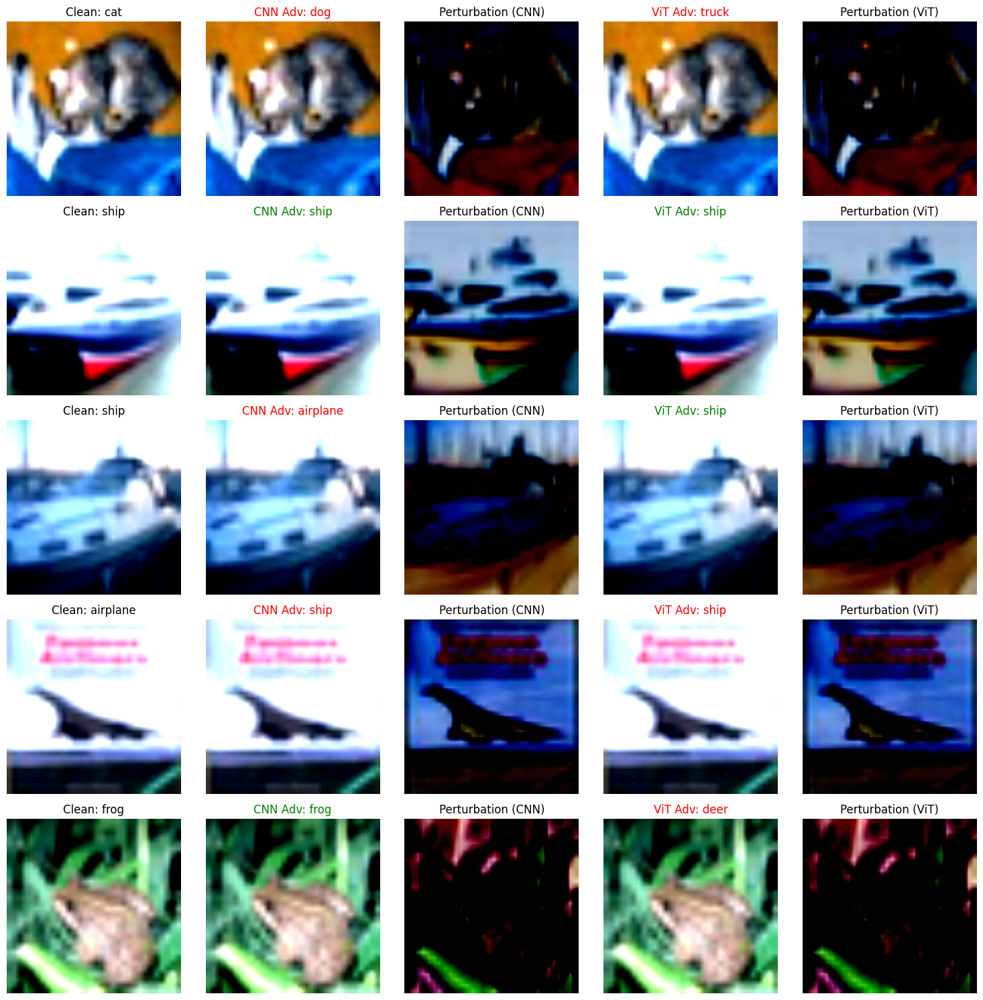

In [51]:
compare_visualizations(images, adv_images_cnn, adv_images_vit, labels.cpu(), preds_cnn, preds_vit, class_names)

# Explainable AI Techniques in Explaining the Models

This section includes using an explainable AI method, saliency map, to explain the prediction output by both CNN and ViT models. The functions for generatin a saliency map and visualizing it is included below.

From the saliency map output, it is obvious that the CNN model focuses more on global features. The saliency map has covered larger proportion of the image (almost everywhere the object is present). On the other hand, the ViT model focuses more on local features. For instance, for the "cat" image, it mainly uses the cat's head to make its prediction decision.



In [54]:
def generate_saliency_map(model, inputs, target_class):
    """
    Generate saliency map for the given model and inputs.
    """
    # Ensure the inputs are leaf tensors by detaching and re-enabling gradient computation
    inputs = inputs.detach()
    inputs.requires_grad = True
    model.eval()

    # Forward pass
    outputs = model(inputs)
    if hasattr(outputs, "logits"):
        outputs = outputs.logits

    # Get the score for the target class
    target_score = outputs[:, target_class].sum()

    # Backward pass to compute gradients
    model.zero_grad()
    target_score.backward()

    # Get the saliency map (gradient magnitude)
    saliency = inputs.grad.abs().max(dim=1)[0]
    return saliency

def visualize_saliency(clean_images, adv_images, saliency_clean, saliency_adv, labels, class_names):
    """
    Visualize clean and adversarial images along with their saliency maps.
    """
    batch_size = clean_images.size(0)
    num_images = min(batch_size, 5)

    clean_images = clean_images.detach().cpu().permute(0, 2, 3, 1)
    adv_images = adv_images.detach().cpu().permute(0, 2, 3, 1)
    saliency_clean = saliency_clean.detach().cpu()
    saliency_adv = saliency_adv.detach().cpu()

    fig, axes = plt.subplots(num_images, 4, figsize=(16, num_images * 3))

    for i in range(num_images):
        # Clean image
        axes[i, 0].imshow(clean_images[i].numpy() * 0.5 + 0.5)
        axes[i, 0].set_title(f"Clean: {class_names[labels[i]]}")
        axes[i, 0].axis("off")

        # Clean saliency map
        axes[i, 1].imshow(saliency_clean[i], cmap="hot")
        axes[i, 1].set_title("Saliency (Clean)")
        axes[i, 1].axis("off")

        # Adversarial image
        axes[i, 2].imshow(adv_images[i].numpy() * 0.5 + 0.5)
        axes[i, 2].set_title("Adversarial")
        axes[i, 2].axis("off")

        # Adversarial saliency map
        axes[i, 3].imshow(saliency_adv[i], cmap="hot")
        axes[i, 3].set_title("Saliency (Adversarial)")
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

In [55]:
# Select a target class (for saliency visualization)
target_class = labels[0].item()

# Generate saliency maps for clean images
saliency_clean_cnn = generate_saliency_map(cnn_model, images.clone(), target_class)
saliency_clean_vit = generate_saliency_map(vit_model, images.clone(), target_class)

# Generate saliency maps for adversarial images
saliency_adv_cnn = generate_saliency_map(cnn_model, adv_images_cnn.clone(), target_class)
saliency_adv_vit = generate_saliency_map(vit_model, adv_images_vit.clone(), target_class)

CNN Saliency Maps:


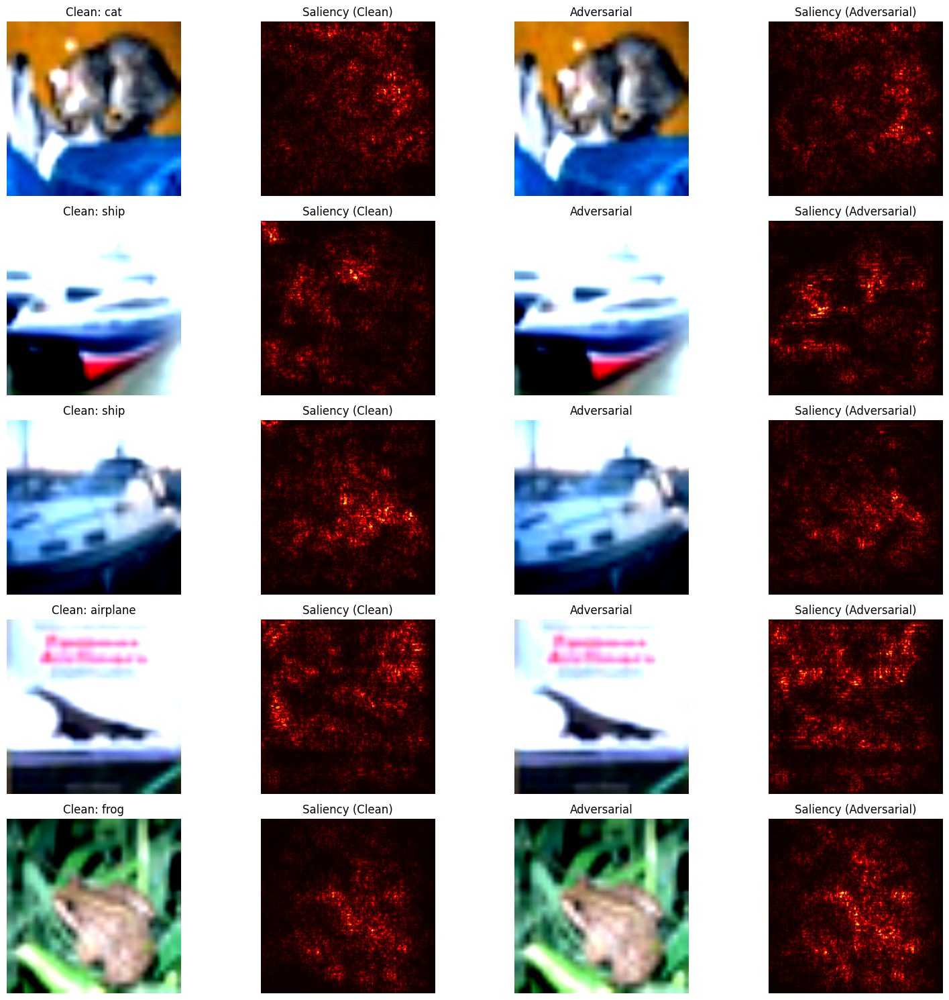

ViT Saliency Maps:


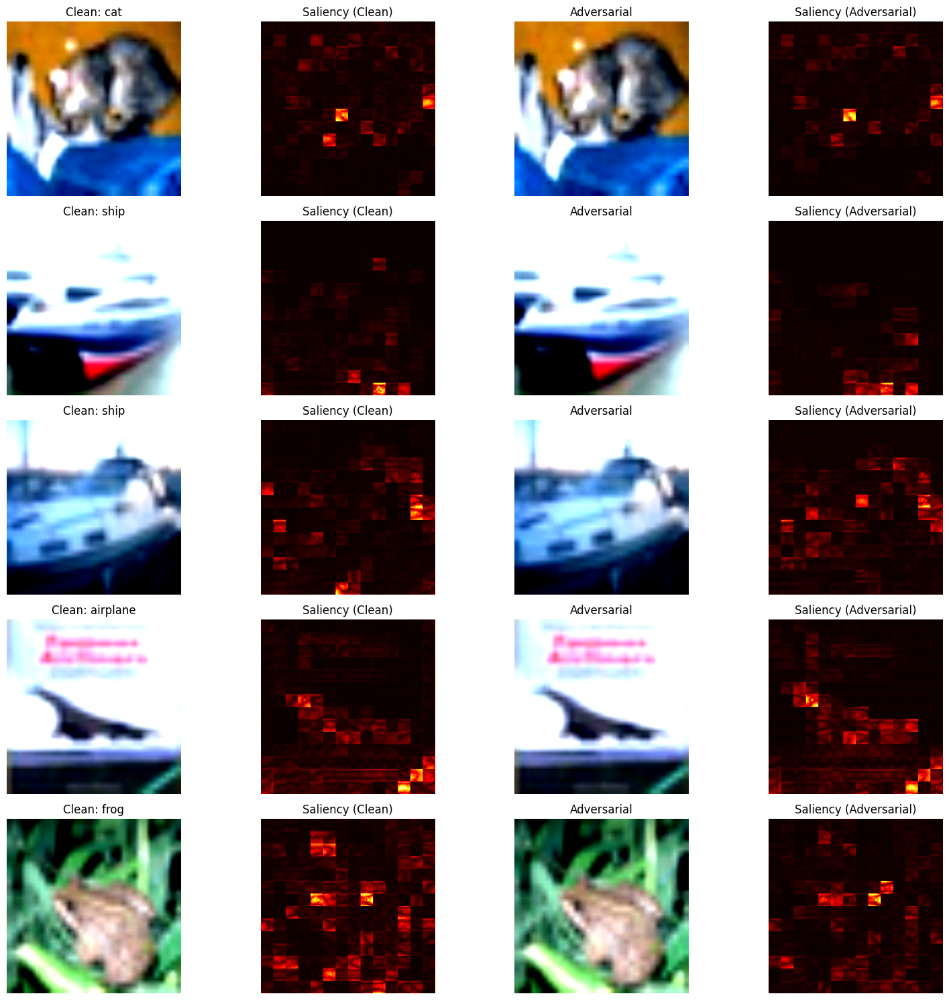

In [56]:
# Define CIFAR-10 class names
class_names = [
    "airplane", "automobile", "bird", "cat", "deer",
    "dog", "frog", "horse", "ship", "truck"
]

# Visualize saliency maps for CNN
print("CNN Saliency Maps:")
visualize_saliency(images, adv_images_cnn, saliency_clean_cnn, saliency_adv_cnn, labels, class_names)

# Visualize saliency maps for ViT
print("ViT Saliency Maps:")
visualize_saliency(images, adv_images_vit, saliency_clean_vit, saliency_adv_vit, labels, class_names)

# Fashion Design Adversarial Attack Example

In this section, an image of a 3D fashion design graphic model went through the ViT adversarial example generator. This image is from a fashion show design produced by my best friend (credit to Chloe Ng). She should 3D graphic builder to visualize this idea she has. I would like to apply adversarial attacks generated by vision transformer to increase the security feature to her design as well as providing additional creative perspectives to her. This generated adversarial attack has random colors associated to the 3D feature which could be suitable under some contexts. A series of adversarial attack exampels can be generated to her entire series of designs to have clear contrast between her original designs (all black and white) and the adversarial designs (colorful).

In [71]:
# conenct to google drive
from google.colab import drive
drive.mount('/content/drive')

# locate My Drive/Adversarial Attack Fashion Show
%cd /content/drive/MyDrive/Adversarial Attack Fashion Show

Mounted at /content/drive
/content/drive/MyDrive/Adversarial Attack Fashion Show


In [77]:
# Load Image which is stored in personal google drive
image_path = "1.jpg"
input_image = Image.open(image_path).convert("RGB")

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

input_tensor = preprocess(input_image).unsqueeze(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_tensor = input_tensor.to(device)

In [97]:
def generate_adversarial_example(model, inputs, target_label, epsilon=0.5):
    """
    Generate adversarial example using FGSM.
    """
    inputs.requires_grad = True
    model.eval()

    # Forward pass
    outputs = model(inputs)
    if hasattr(outputs, "logits"):  # For ViT
        outputs = outputs.logits

    # Compute loss for the target label
    loss = torch.nn.CrossEntropyLoss()(outputs, target_label)
    model.zero_grad()
    loss.backward()

    # Generate adversarial example
    adv_inputs = inputs + epsilon * inputs.grad.sign()
    adv_inputs = torch.clamp(adv_inputs, 0, 1)
    return adv_inputs

In [98]:
# Preprocess the image for ViT
vit_processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")
vit_inputs = vit_processor(images=input_image, return_tensors="pt").to(device)

# Forward pass through ViT
vit_model = vit_model.to(device)
outputs = vit_model(**vit_inputs)
target_label = torch.argmax(outputs.logits, dim=1)

# Generate adversarial example
adv_image_vit = generate_adversarial_example(vit_model, input_tensor.clone(), target_label)

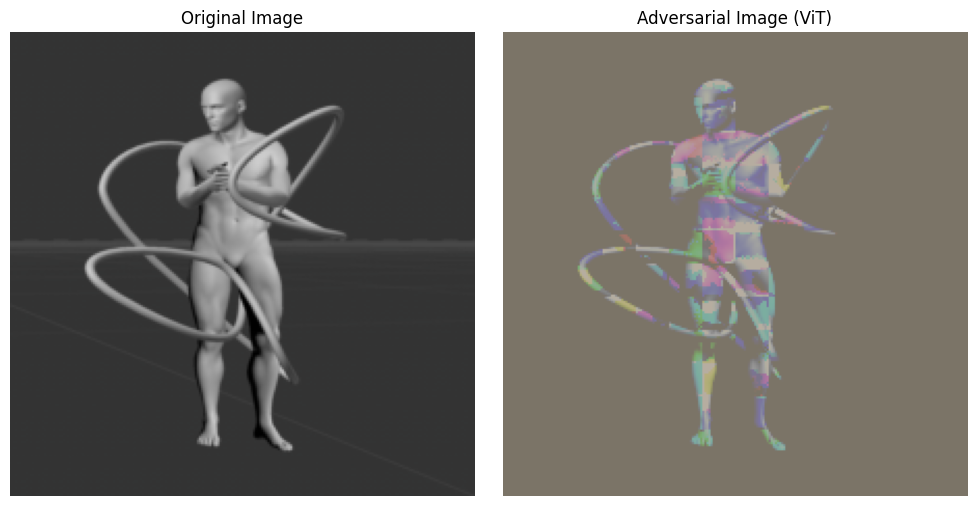

In [99]:
# Denormalize the images
clean_image = denormalize(input_tensor).squeeze().permute(1, 2, 0).detach().cpu()
adv_image_vit = denormalize(adv_image_vit).squeeze().permute(1, 2, 0).detach().cpu()

# Plot the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Original image
axes[0].imshow(clean_image.numpy())
axes[0].set_title("Original Image")
axes[0].axis("off")

# Adversarial image (ViT)
axes[1].imshow(adv_image_vit.numpy())
axes[1].set_title("Adversarial Image (ViT)")
axes[1].axis("off")

plt.tight_layout()
plt.show()